In [26]:
import os
import cv2
import json
import glob
import numpy as np
import pandas as pd

import seaborn as sns
import matplotlib.pyplot as plt
import plotly.graph_objects as go

from tqdm import tqdm
from natsort import natsorted

from scipy import signal
from scipy.io import wavfile
from scipy.ndimage import sobel

In [27]:
with open(os.path.join(os.getcwd(), "data_path_config.json"), "r") as f:
    config = json.load(f)

config

{'raw_data': 'D:\\Projects\\masters_diploma\\data\\raw\\EmoReact',
 'processed_data': 'D:\\Projects\\masters_diploma\\data\\processed\\EmoReact',
 'videos': 'D:\\Projects\\masters_diploma\\data\\raw\\EmoReact\\videos',
 'visual_features': 'D:\\Projects\\masters_diploma\\data\\raw\\EmoReact\\visual_features',
 'datasets': 'D:\\Projects\\masters_diploma\\data\\processed\\EmoReact\\datasets',
 'datasets_videos': 'D:\\Projects\\masters_diploma\\data\\processed\\EmoReact\\datasets\\videos',
 'datasets_visual_features': 'D:\\Projects\\masters_diploma\\data\\processed\\EmoReact\\datasets\\visual_features',
 'images': 'D:\\Projects\\masters_diploma\\data\\processed\\EmoReact\\images',
 'datasets_images': 'D:\\Projects\\masters_diploma\\data\\processed\\EmoReact\\datasets\\images',
 'audio': 'D:\\Projects\\masters_diploma\\data\\processed\\EmoReact\\audio',
 'datasets_audio': 'D:\\Projects\\masters_diploma\\data\\processed\\EmoReact\\datasets\\audio',
 'audio_216k': 'D:\\Projects\\masters_diplo

In [28]:
def select_major_emotion(emotion_vector: np.array) -> np.array:
    """
    Returns the major emotion based on significance while retaining the original order.

    :param emotion_vector: List of binary values representing emotions.
    :return: A new binary vector with only the major emotion set to 1.
    """

    # Original order of emotions
    original_order = ["Curiosity", "Uncertainty", "Excitement", "Happiness",
                     "Surprise", "Disgust", "Fear", "Frustration"]

    # New order of significance
    new_order = ["Happiness", "Excitement", "Disgust", "Fear", "Frustration",
                 "Surprise", "Curiosity", "Uncertainty"]

    # Extract emotions from initial vector
    indicated_emotions = [original_order[i] for i, e in enumerate(emotion_vector) if e == 1]

    # Determine the most significant emotion from the new order
    for emotion in new_order:
        if emotion in indicated_emotions:
            major = emotion
            break

    # Create and return the new vector based on original order
    return np.array([1 if emotion == major else 0 for emotion in original_order])

In [29]:
def log_spectrogram(audio, sample_rate, window_size=20,
                    step_size=10, eps=1e-10):
    nperseg = int(round(window_size * sample_rate / 1e3))
    noverlap = int(round(step_size * sample_rate / 1e3))

    freqs, _, spec = signal.spectrogram(
        audio,
        fs=sample_rate,
        window='hann',
        nperseg=nperseg,
        noverlap=noverlap,
        detrend=False
    )

    return freqs, np.log(spec.T.astype(np.float32) + eps)


def audio2spectrogram(filepath: str) -> np.ndarray:
    samplerate, test_sound = wavfile.read(filepath, mmap=True)

    _, spectrogram = log_spectrogram(test_sound, samplerate)

    return spectrogram


def audio2wave(filepath) -> np.ndarray:
    _, test_sound = wavfile.read(filepath, mmap=True)

    return test_sound


def gradients_channels(grayscale_array: np.ndarray) -> np.ndarray:
    gradient_x = sobel(grayscale_array, axis=0)
    gradient_y = sobel(grayscale_array, axis=1)

    return np.stack([grayscale_array, gradient_x, gradient_y], axis=-1)


def get_3d_spectrogram(Sxx_in, moments=None):
    if moments is not None:
        (base_mean, base_std, delta_mean, delta_std,
             delta2_mean, delta2_std) = moments
    else:
        base_mean, delta_mean, delta2_mean = (0, 0, 0)
        base_std, delta_std, delta2_std = (1, 1, 1)

    h, w = Sxx_in.shape

    right1 = np.concatenate([Sxx_in[:, 0].reshape((h, -1)), Sxx_in], axis=1)[:, :-1]
    delta = (Sxx_in - right1)[:, 1:]
    delta_pad = delta[:, 0].reshape((h, -1))
    delta = np.concatenate([delta_pad, delta], axis=1)

    right2 = np.concatenate([delta[:, 0].reshape((h, -1)), delta], axis=1)[:, :-1]
    delta2 = (delta - right2)[:, 1:]
    delta2_pad = delta2[:, 0].reshape((h, -1))
    delta2 = np.concatenate([delta2_pad, delta2], axis=1)

    base = (Sxx_in - base_mean) / base_std
    delta = (delta - delta_mean) / delta_std
    delta2 = (delta2 - delta2_mean) / delta2_std

    stacked = [arr.reshape((h, w, 1)) for arr in (base, delta, delta2)]

    return np.concatenate(stacked, axis=2)

In [30]:
emotion_dict = {
    0: "Curiosity",
    1: "Uncertainty",
    2: "Excitement",
    3: "Happiness",
    4: "Surprise",
    5: "Disgust",
    6: "Fear",
    7: "Frustration"
}

In [31]:
def visualize_spectrogram(spectrogram, emotion_name, spec_name):
    fig = plt.figure(figsize=(10, 6))
    plt.grid(False)
    plt.imshow(spectrogram.T[:, :350], aspect='auto', origin='lower', cmap="viridis")

    plt.ylabel("Hz")
    plt.title(f"{spec_name} of emotion *{emotion_name}*")
    plt.show()

In [32]:
def visualize_emotion(spectrogram, emotion_name, spec_name):
    fig = plt.figure(figsize=(10, 6))
    plt.grid(False)
    plt.imshow(spectrogram.T[:, :350, :], aspect='auto', origin='lower', cmap="magma")

    plt.ylabel("Hz")
    plt.title(f"{spec_name} of emotion *{emotion_name}*")
    plt.show()

In [33]:
def visualize_wave(_wave, emotion_name, spec_name):
    fig = plt.figure(figsize=(10, 6))
    plt.grid(False)
    plt.plot(_wave)

    plt.ylabel("Hz")
    plt.title(f"{spec_name} of emotion *{emotion_name}*")
    plt.show()

# Train analysis

In [34]:
dataset_name = "Train"
df = pd.read_csv(os.path.join(config["datasets_audio_216k"], "train.csv"))

# Drop cases, where there are no detected emotions
df = df[df.iloc[:, 1:-1].eq(1).any(axis=1)]

emotions_agg = []
for el_id in range(len(df.index)):
    _labels_list = np.array(df.iloc[el_id, 1:-1].values, dtype=int)
    _label = select_major_emotion(emotion_vector=_labels_list)
    emotions_agg.append(np.argmax(_label))

df["major_emotion"] = emotions_agg
df

,file_path,Curiosity,Uncertainty,Excitement,Happiness,Surprise,Disgust,Fear,Frustration,Valence,major_emotion
0,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,1,0,0,0,0,3.3333,3
1,D:\Projects\masters_diploma\data\processed\Emo...,0,0,1,1,0,0,0,0,6.3333,3
4,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,1,0,0,0,0,4.6667,3
6,D:\Projects\masters_diploma\data\processed\Emo...,0,0,1,1,0,0,0,0,6.0000,3
7,D:\Projects\masters_diploma\data\processed\Emo...,0,0,1,1,0,0,0,0,5.0000,3
...,...,...,...,...,...,...,...,...,...,...,...
427,D:\Projects\masters_diploma\data\processed\Emo...,1,1,0,1,1,0,0,0,4.6667,3
428,D:\Projects\masters_diploma\data\processed\Emo...,1,0,1,1,1,0,0,0,5.6667,3
429,D:\Projects\masters_diploma\data\processed\Emo...,1,1,0,1,0,0,0,0,5.3333,3
430,D:\Projects\masters_diploma\data\processed\Emo...,1,1,0,0,0,0,0,0,4.3333,0


### Curiosity

In [35]:
emotion_num = 0

df_emotion = df[df["major_emotion"] == emotion_num]
df_emotion

,file_path,Curiosity,Uncertainty,Excitement,Happiness,Surprise,Disgust,Fear,Frustration,Valence,major_emotion
9,D:\Projects\masters_diploma\data\processed\Emo...,1,1,0,0,0,0,0,0,2.6667,0
10,D:\Projects\masters_diploma\data\processed\Emo...,1,0,0,0,0,0,0,0,4.6667,0
33,D:\Projects\masters_diploma\data\processed\Emo...,1,0,0,0,0,0,0,0,4.3333,0
34,D:\Projects\masters_diploma\data\processed\Emo...,1,1,0,0,0,0,0,0,2.6667,0
80,D:\Projects\masters_diploma\data\processed\Emo...,1,1,0,0,0,0,0,0,4.3333,0
130,D:\Projects\masters_diploma\data\processed\Emo...,1,0,0,0,0,0,0,0,4.0000,0
144,D:\Projects\masters_diploma\data\processed\Emo...,1,0,0,0,0,0,0,0,3.3333,0
152,D:\Projects\masters_diploma\data\processed\Emo...,1,1,0,0,0,0,0,0,3.6667,0
173,D:\Projects\masters_diploma\data\processed\Emo...,1,0,0,0,0,0,0,0,3.3333,0
198,D:\Projects\masters_diploma\data\processed\Emo...,1,1,0,0,0,0,0,0,4.3333,0


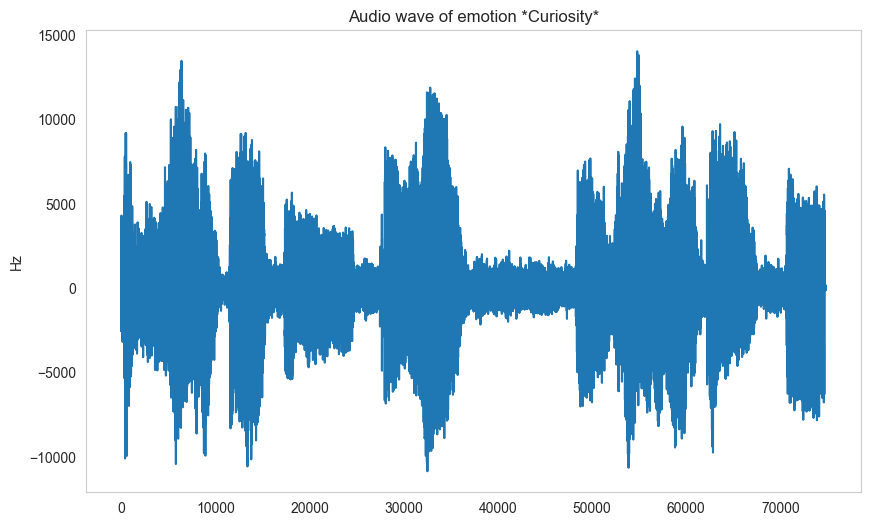

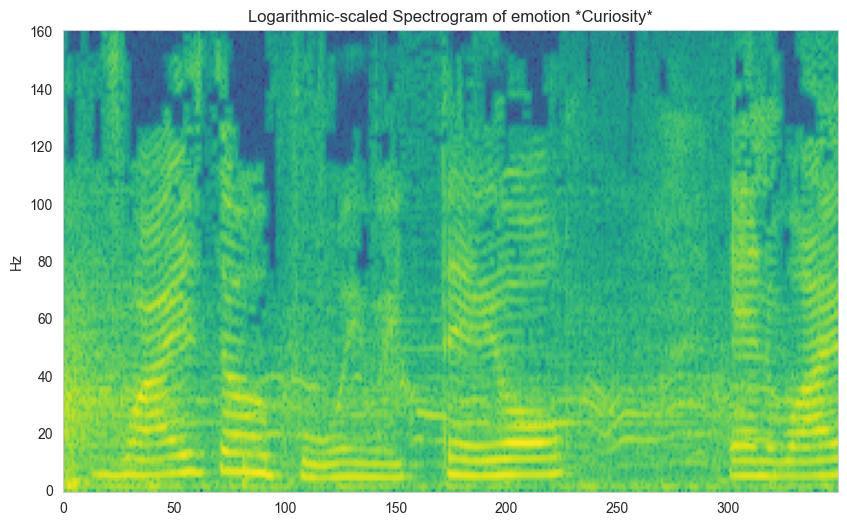

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


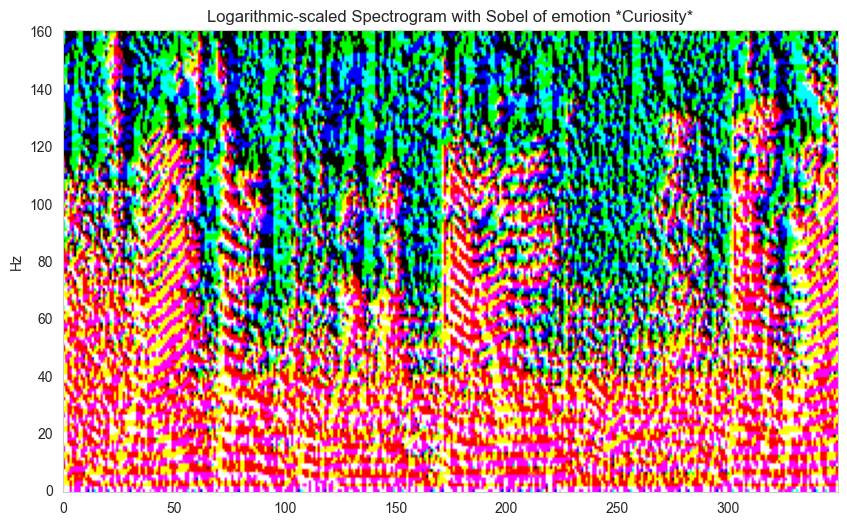

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


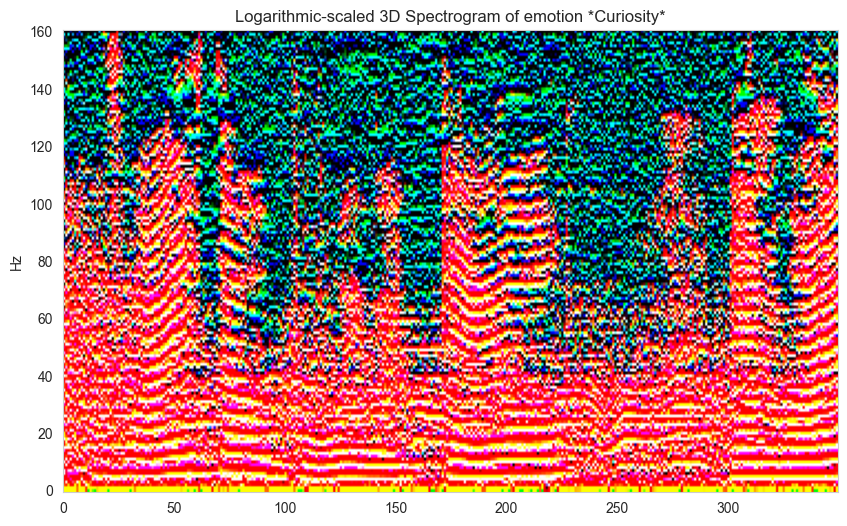

In [36]:
_audio_wave = audio2wave(filepath=df_emotion["file_path"].to_list()[8])
visualize_wave(_audio_wave, emotion_dict[emotion_num], "Audio wave")

_audio_spectrogram = audio2spectrogram(filepath=df_emotion["file_path"].to_list()[8])
visualize_spectrogram(_audio_spectrogram, emotion_dict[emotion_num], "Logarithmic-scaled Spectrogram")

# Sobel 3D
_audio_spectrogram_3d_sobel = gradients_channels(_audio_spectrogram)
visualize_emotion(_audio_spectrogram_3d_sobel.transpose(2, 0, 1), emotion_dict[emotion_num], "Logarithmic-scaled Spectrogram with Sobel")

# 3D
_audio_spectrogram_3d = get_3d_spectrogram(_audio_spectrogram)
visualize_emotion(_audio_spectrogram_3d.transpose(2, 0, 1), emotion_dict[emotion_num], "Logarithmic-scaled 3D Spectrogram")

### Uncertainty

In [37]:
emotion_num = 1

df_emotion = df[df["major_emotion"] == emotion_num]
df_emotion

,file_path,Curiosity,Uncertainty,Excitement,Happiness,Surprise,Disgust,Fear,Frustration,Valence,major_emotion
11,D:\Projects\masters_diploma\data\processed\Emo...,0,1,0,0,0,0,0,0,2.6667,1
51,D:\Projects\masters_diploma\data\processed\Emo...,0,1,0,0,0,0,0,0,3.3333,1
170,D:\Projects\masters_diploma\data\processed\Emo...,0,1,0,0,0,0,0,0,3.6667,1
226,D:\Projects\masters_diploma\data\processed\Emo...,0,1,0,0,0,0,0,0,3.6667,1
252,D:\Projects\masters_diploma\data\processed\Emo...,0,1,0,0,0,0,0,0,3.6667,1
257,D:\Projects\masters_diploma\data\processed\Emo...,0,1,0,0,0,0,0,0,3.3333,1
262,D:\Projects\masters_diploma\data\processed\Emo...,0,1,0,0,0,0,0,0,4.0000,1
295,D:\Projects\masters_diploma\data\processed\Emo...,0,1,0,0,0,0,0,0,4.3333,1
356,D:\Projects\masters_diploma\data\processed\Emo...,0,1,0,0,0,0,0,0,4.0000,1
383,D:\Projects\masters_diploma\data\processed\Emo...,0,1,0,0,0,0,0,0,4.3333,1


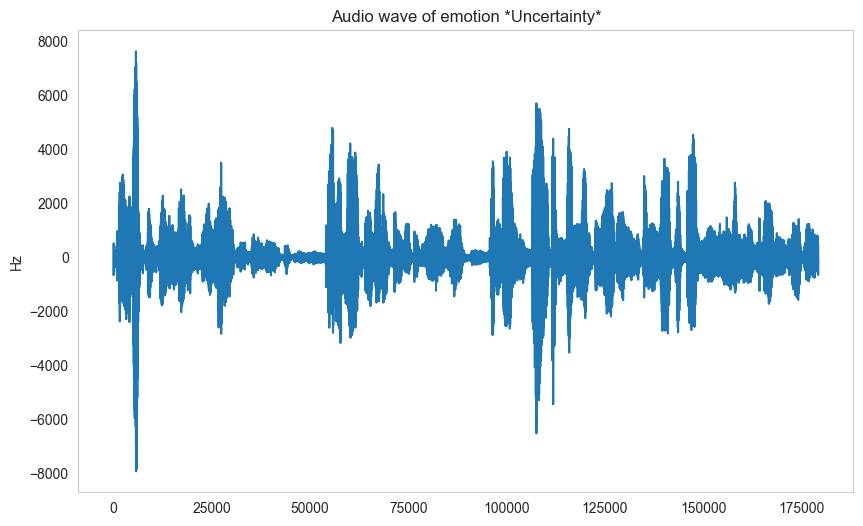

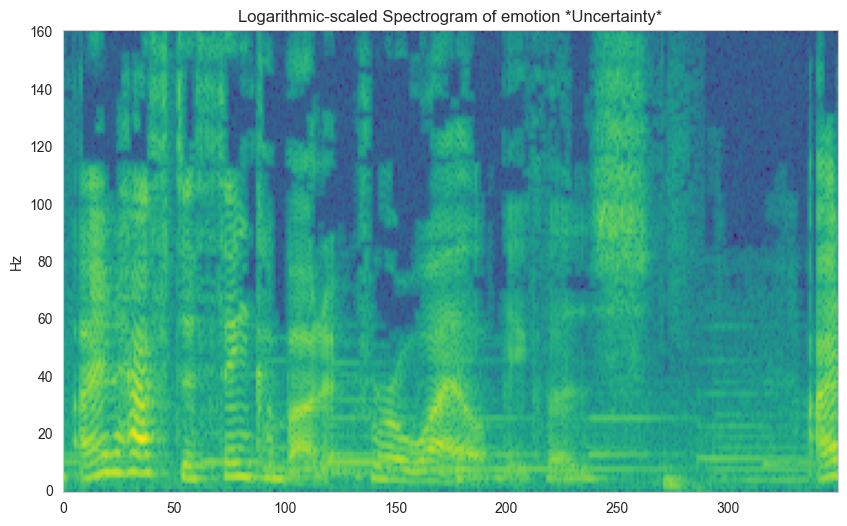

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


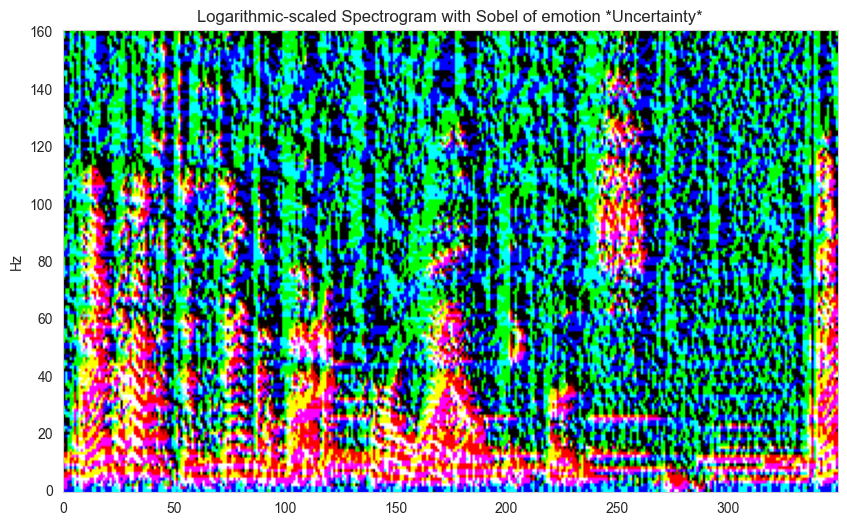

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


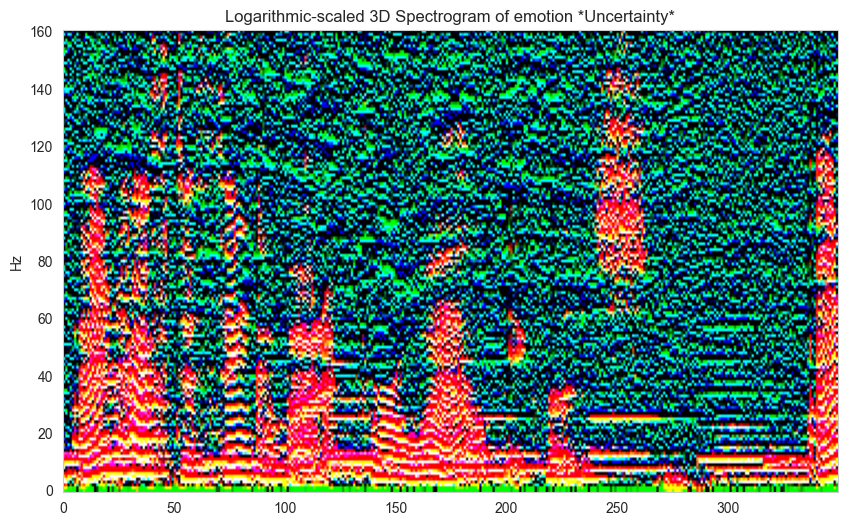

In [38]:
_audio_wave = audio2wave(filepath=df_emotion["file_path"].to_list()[1])
visualize_wave(_audio_wave, emotion_dict[emotion_num], "Audio wave")

_audio_spectrogram = audio2spectrogram(filepath=df_emotion["file_path"].to_list()[1])
visualize_spectrogram(_audio_spectrogram, emotion_dict[emotion_num], "Logarithmic-scaled Spectrogram")

# Sobel 3D
_audio_spectrogram_3d_sobel = gradients_channels(_audio_spectrogram)
visualize_emotion(_audio_spectrogram_3d_sobel.transpose(2, 0, 1), emotion_dict[emotion_num], "Logarithmic-scaled Spectrogram with Sobel")

# 3D
_audio_spectrogram_3d = get_3d_spectrogram(_audio_spectrogram)
visualize_emotion(_audio_spectrogram_3d.transpose(2, 0, 1), emotion_dict[emotion_num], "Logarithmic-scaled 3D Spectrogram")

### Excitement

In [39]:
emotion_num = 2

df_emotion = df[df["major_emotion"] == emotion_num]
df_emotion

,file_path,Curiosity,Uncertainty,Excitement,Happiness,Surprise,Disgust,Fear,Frustration,Valence,major_emotion
8,D:\Projects\masters_diploma\data\processed\Emo...,1,1,1,0,1,0,0,0,5.0000,2
20,D:\Projects\masters_diploma\data\processed\Emo...,0,1,1,0,0,0,0,0,2.6667,2
27,D:\Projects\masters_diploma\data\processed\Emo...,0,0,1,0,0,1,0,1,2.3333,2
30,D:\Projects\masters_diploma\data\processed\Emo...,0,0,1,0,0,0,0,0,3.6667,2
50,D:\Projects\masters_diploma\data\processed\Emo...,0,0,1,0,0,0,0,0,2.0000,2
67,D:\Projects\masters_diploma\data\processed\Emo...,0,0,1,0,0,0,0,0,3.0000,2
70,D:\Projects\masters_diploma\data\processed\Emo...,0,0,1,0,0,0,0,0,3.6667,2
73,D:\Projects\masters_diploma\data\processed\Emo...,0,0,1,0,0,0,0,1,3.6667,2
84,D:\Projects\masters_diploma\data\processed\Emo...,1,1,1,0,1,0,0,1,3.0000,2
87,D:\Projects\masters_diploma\data\processed\Emo...,0,1,1,0,1,1,1,1,1.6667,2


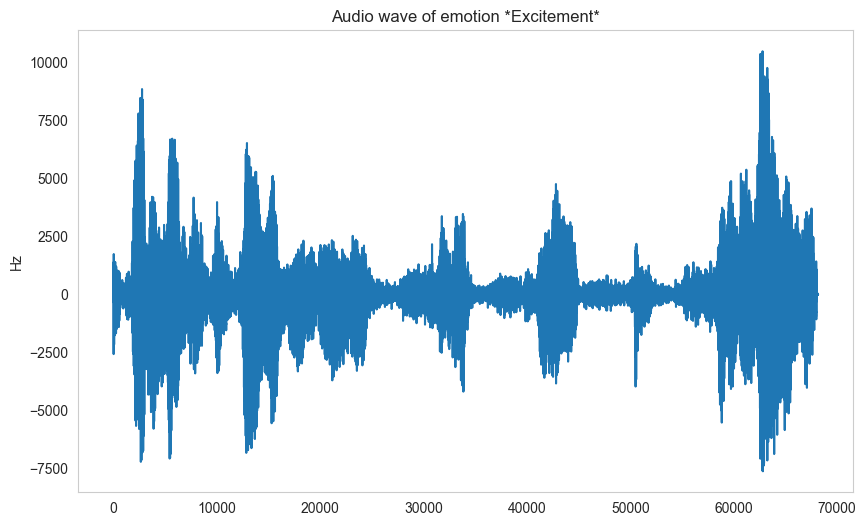

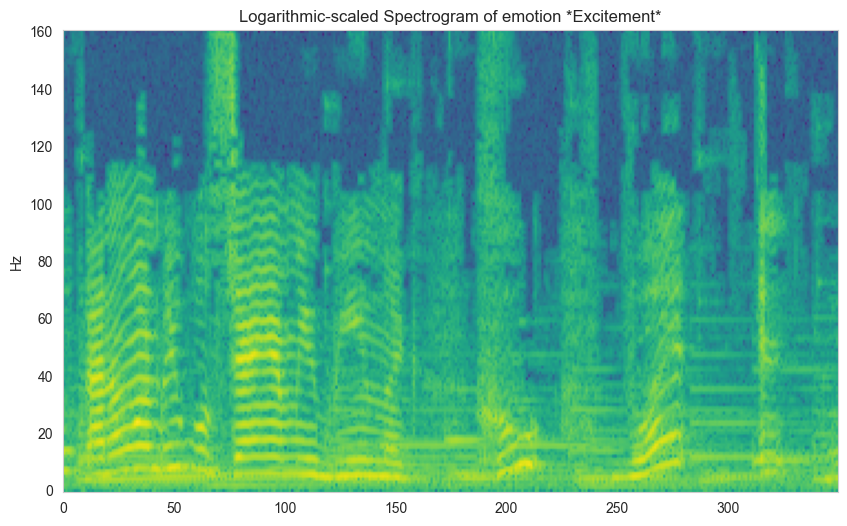

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


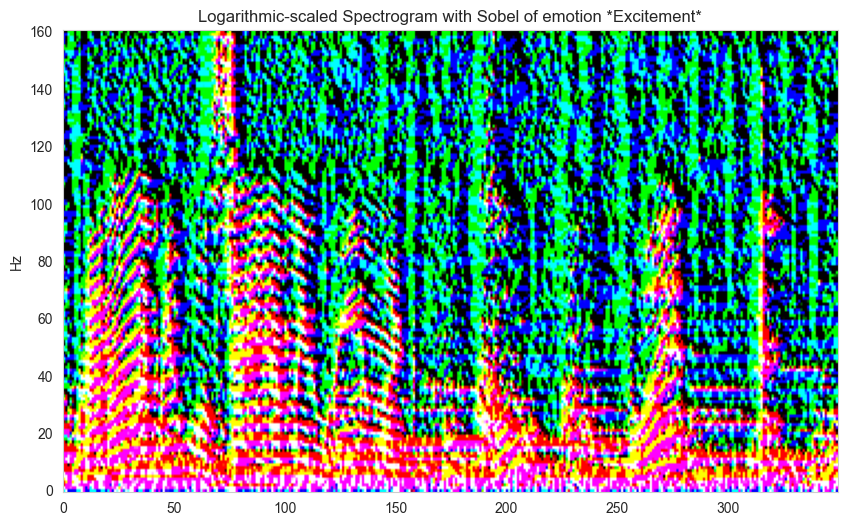

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


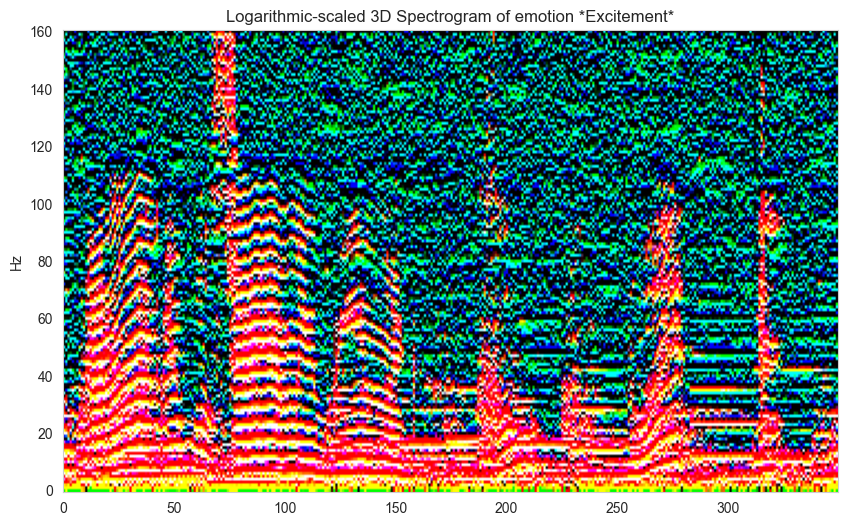

In [40]:
_audio_wave = audio2wave(filepath=df_emotion["file_path"].to_list()[1])
visualize_wave(_audio_wave, emotion_dict[emotion_num], "Audio wave")

_audio_spectrogram = audio2spectrogram(filepath=df_emotion["file_path"].to_list()[1])
visualize_spectrogram(_audio_spectrogram, emotion_dict[emotion_num], "Logarithmic-scaled Spectrogram")

# Sobel 3D
_audio_spectrogram_3d_sobel = gradients_channels(_audio_spectrogram)
visualize_emotion(_audio_spectrogram_3d_sobel.transpose(2, 0, 1), emotion_dict[emotion_num], "Logarithmic-scaled Spectrogram with Sobel")

# 3D
_audio_spectrogram_3d = get_3d_spectrogram(_audio_spectrogram)
visualize_emotion(_audio_spectrogram_3d.transpose(2, 0, 1), emotion_dict[emotion_num], "Logarithmic-scaled 3D Spectrogram")

### Happiness

In [41]:
emotion_num = 3

df_emotion = df[df["major_emotion"] == emotion_num]
df_emotion

,file_path,Curiosity,Uncertainty,Excitement,Happiness,Surprise,Disgust,Fear,Frustration,Valence,major_emotion
0,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,1,0,0,0,0,3.3333,3
1,D:\Projects\masters_diploma\data\processed\Emo...,0,0,1,1,0,0,0,0,6.3333,3
4,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,1,0,0,0,0,4.6667,3
6,D:\Projects\masters_diploma\data\processed\Emo...,0,0,1,1,0,0,0,0,6.0000,3
7,D:\Projects\masters_diploma\data\processed\Emo...,0,0,1,1,0,0,0,0,5.0000,3
...,...,...,...,...,...,...,...,...,...,...,...
425,D:\Projects\masters_diploma\data\processed\Emo...,1,1,1,1,1,0,0,0,5.6667,3
427,D:\Projects\masters_diploma\data\processed\Emo...,1,1,0,1,1,0,0,0,4.6667,3
428,D:\Projects\masters_diploma\data\processed\Emo...,1,0,1,1,1,0,0,0,5.6667,3
429,D:\Projects\masters_diploma\data\processed\Emo...,1,1,0,1,0,0,0,0,5.3333,3


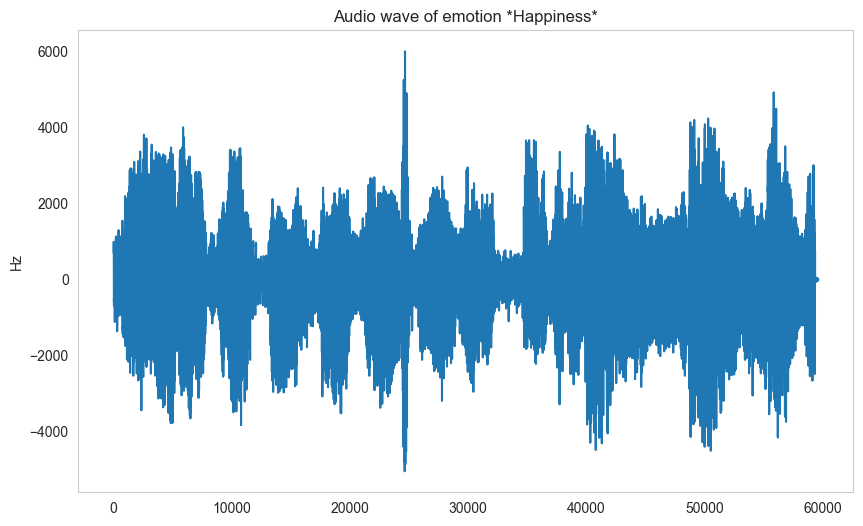

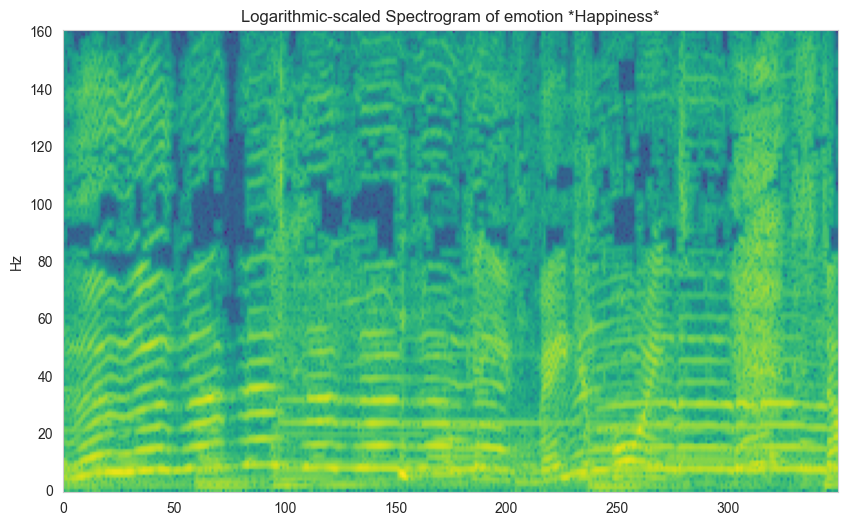

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


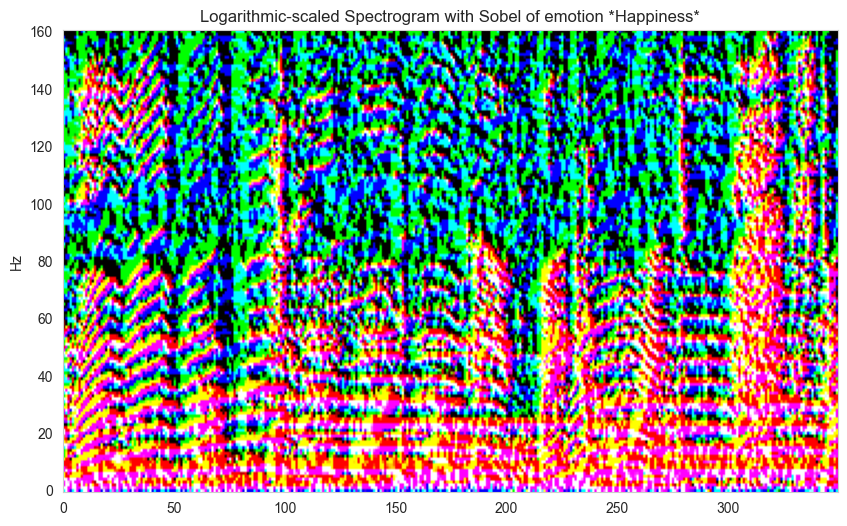

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


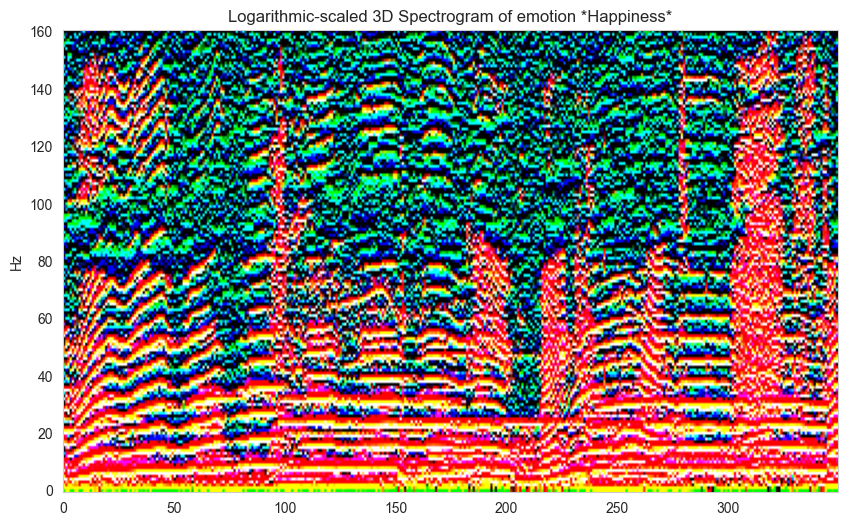

In [42]:
_audio_wave = audio2wave(filepath=df_emotion["file_path"].to_list()[5])
visualize_wave(_audio_wave, emotion_dict[emotion_num], "Audio wave")

_audio_spectrogram = audio2spectrogram(filepath=df_emotion["file_path"].to_list()[5])
visualize_spectrogram(_audio_spectrogram, emotion_dict[emotion_num], "Logarithmic-scaled Spectrogram")

# Sobel 3D
_audio_spectrogram_3d_sobel = gradients_channels(_audio_spectrogram)
visualize_emotion(_audio_spectrogram_3d_sobel.transpose(2, 0, 1), emotion_dict[emotion_num], "Logarithmic-scaled Spectrogram with Sobel")

# 3D
_audio_spectrogram_3d = get_3d_spectrogram(_audio_spectrogram)
visualize_emotion(_audio_spectrogram_3d.transpose(2, 0, 1), emotion_dict[emotion_num], "Logarithmic-scaled 3D Spectrogram")

### Surprise

In [43]:
emotion_num = 4

df_emotion = df[df["major_emotion"] == emotion_num]
df_emotion

,file_path,Curiosity,Uncertainty,Excitement,Happiness,Surprise,Disgust,Fear,Frustration,Valence,major_emotion
86,D:\Projects\masters_diploma\data\processed\Emo...,1,1,0,0,1,0,0,0,3.0000,4
237,D:\Projects\masters_diploma\data\processed\Emo...,1,0,0,0,1,0,0,0,3.3333,4
240,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,0,1,0,0,0,3.6667,4
271,D:\Projects\masters_diploma\data\processed\Emo...,1,0,0,0,1,0,0,0,3.0000,4
340,D:\Projects\masters_diploma\data\processed\Emo...,1,1,0,0,1,0,0,0,4.0000,4
349,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,0,1,0,0,0,3.3333,4
360,D:\Projects\masters_diploma\data\processed\Emo...,0,1,0,0,1,0,0,0,3.3333,4
362,D:\Projects\masters_diploma\data\processed\Emo...,0,1,0,0,1,0,0,0,3.3333,4
364,D:\Projects\masters_diploma\data\processed\Emo...,1,1,0,0,1,0,0,0,2.6667,4
376,D:\Projects\masters_diploma\data\processed\Emo...,1,1,0,0,1,0,0,0,4.0000,4


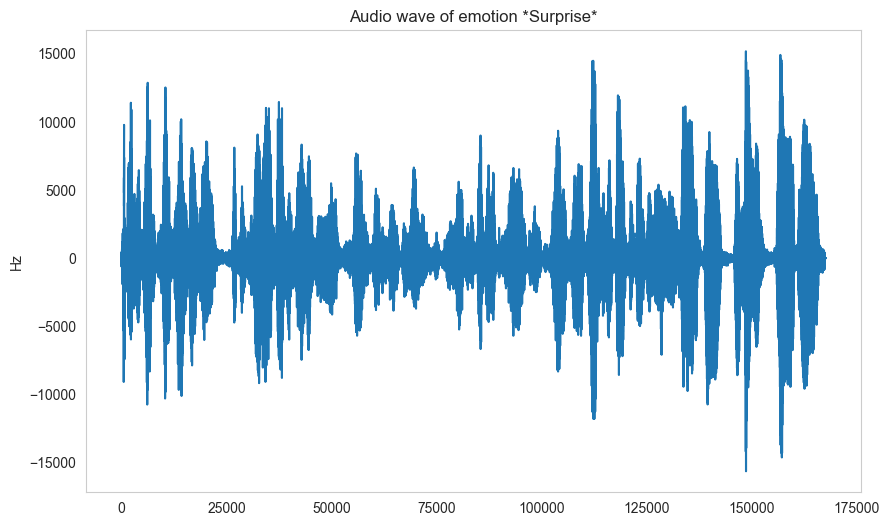

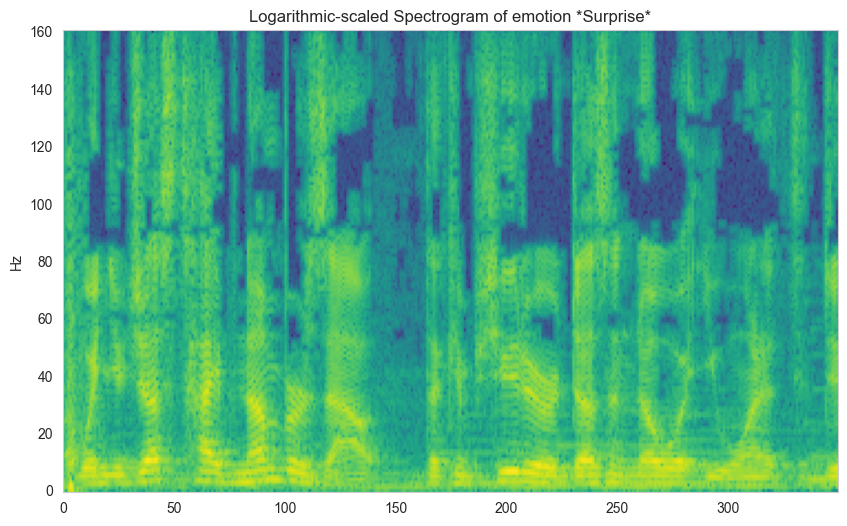

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


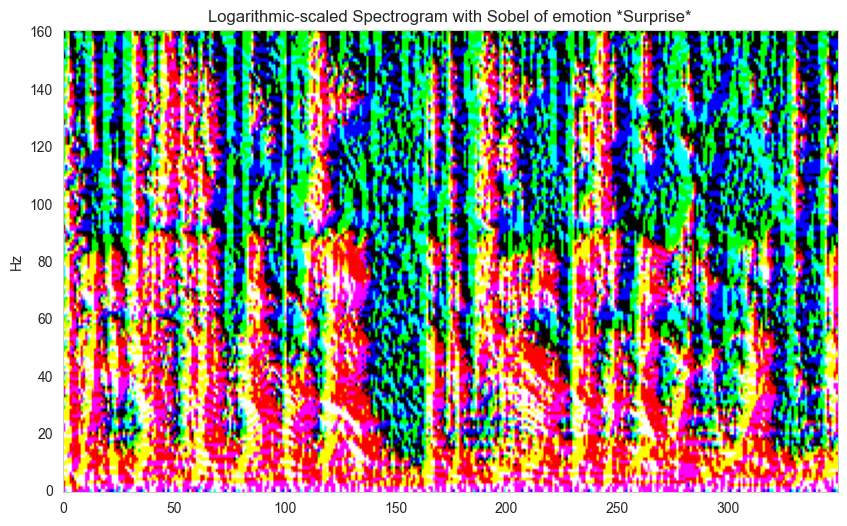

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


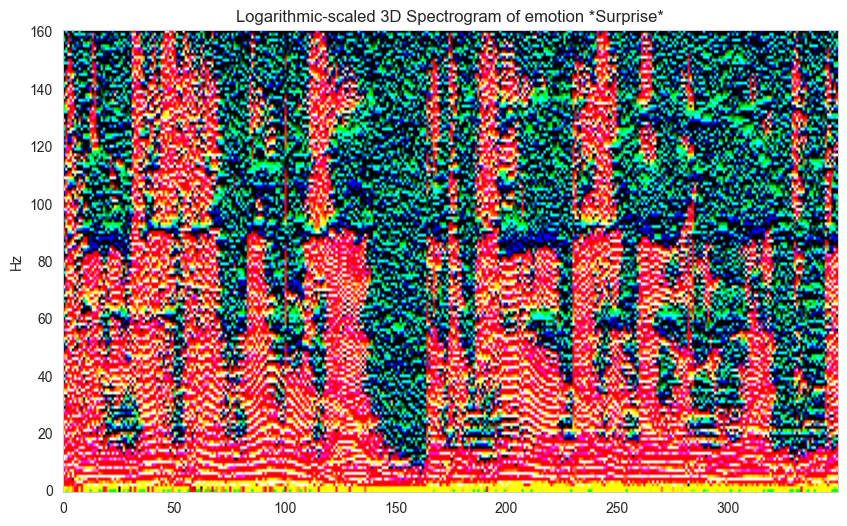

In [44]:
_audio_wave = audio2wave(filepath=df_emotion["file_path"].to_list()[2])
visualize_wave(_audio_wave, emotion_dict[emotion_num], "Audio wave")

_audio_spectrogram = audio2spectrogram(filepath=df_emotion["file_path"].to_list()[2])
visualize_spectrogram(_audio_spectrogram, emotion_dict[emotion_num], "Logarithmic-scaled Spectrogram")

# Sobel 3D
_audio_spectrogram_3d_sobel = gradients_channels(_audio_spectrogram)
visualize_emotion(_audio_spectrogram_3d_sobel.transpose(2, 0, 1), emotion_dict[emotion_num], "Logarithmic-scaled Spectrogram with Sobel")

# 3D
_audio_spectrogram_3d = get_3d_spectrogram(_audio_spectrogram)
visualize_emotion(_audio_spectrogram_3d.transpose(2, 0, 1), emotion_dict[emotion_num], "Logarithmic-scaled 3D Spectrogram")

### Disgust

In [45]:
emotion_num = 5

df_emotion = df[df["major_emotion"] == emotion_num]
df_emotion

,file_path,Curiosity,Uncertainty,Excitement,Happiness,Surprise,Disgust,Fear,Frustration,Valence,major_emotion
45,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,0,0,1,0,1,2.0000,5
49,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,0,0,1,0,1,2.6667,5
54,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,0,0,1,0,0,3.0000,5
61,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,0,0,1,0,0,2.3333,5
64,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,0,0,1,0,0,2.6667,5
88,D:\Projects\masters_diploma\data\processed\Emo...,1,1,0,0,1,1,0,0,3.6667,5
90,D:\Projects\masters_diploma\data\processed\Emo...,1,1,0,0,1,1,0,0,2.6667,5
91,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,0,0,1,0,0,1.3333,5
94,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,0,0,1,0,0,1.6667,5
95,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,0,0,1,0,0,2.3333,5


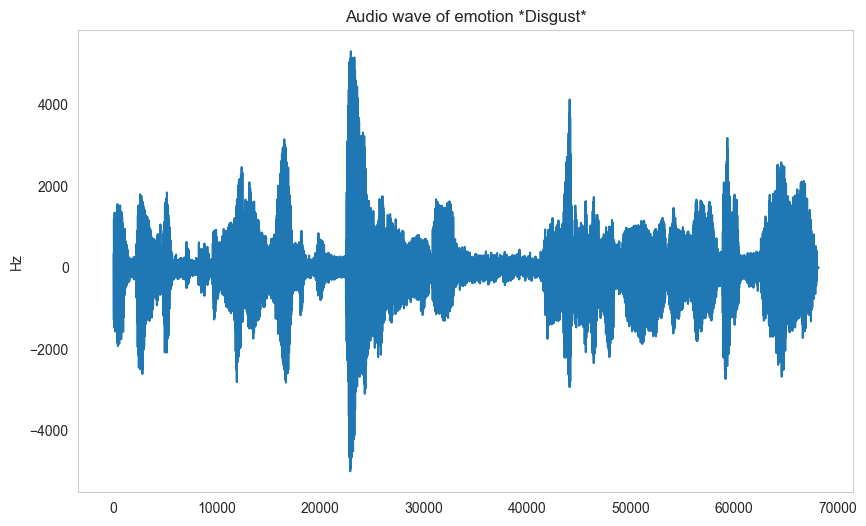

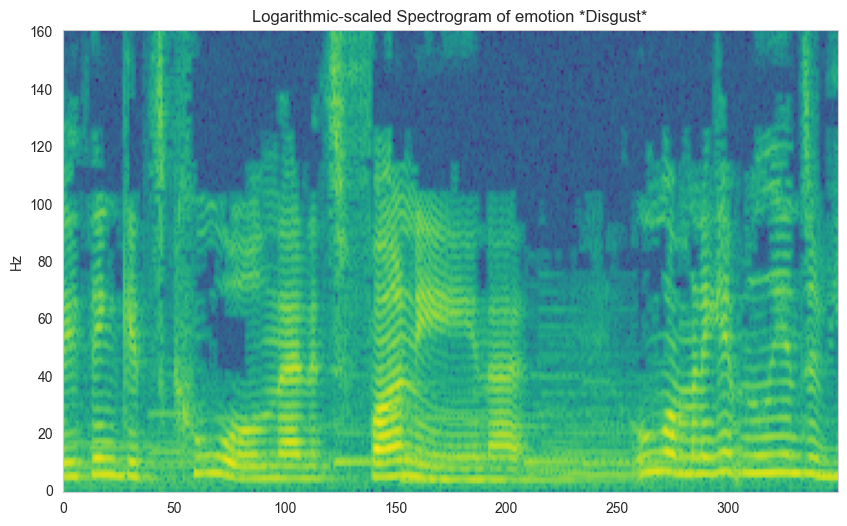

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


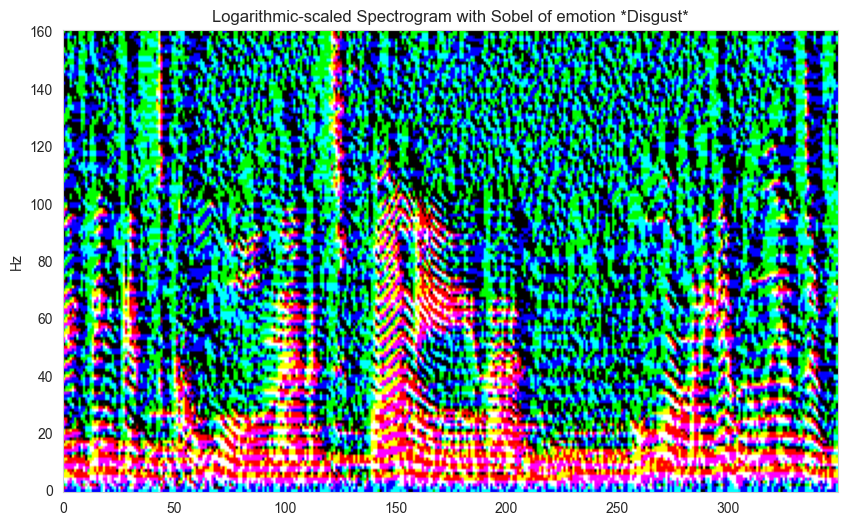

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


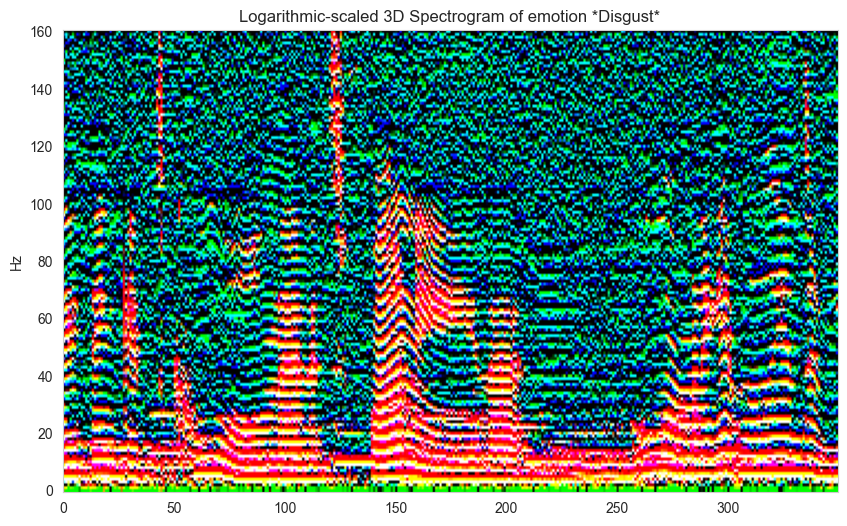

In [46]:
_audio_wave = audio2wave(filepath=df_emotion["file_path"].to_list()[3])
visualize_wave(_audio_wave, emotion_dict[emotion_num], "Audio wave")

_audio_spectrogram = audio2spectrogram(filepath=df_emotion["file_path"].to_list()[3])
visualize_spectrogram(_audio_spectrogram, emotion_dict[emotion_num], "Logarithmic-scaled Spectrogram")

# Sobel 3D
_audio_spectrogram_3d_sobel = gradients_channels(_audio_spectrogram)
visualize_emotion(_audio_spectrogram_3d_sobel.transpose(2, 0, 1), emotion_dict[emotion_num], "Logarithmic-scaled Spectrogram with Sobel")

# 3D
_audio_spectrogram_3d = get_3d_spectrogram(_audio_spectrogram)
visualize_emotion(_audio_spectrogram_3d.transpose(2, 0, 1), emotion_dict[emotion_num], "Logarithmic-scaled 3D Spectrogram")

### Fear

In [47]:
emotion_num = 6

df_emotion = df[df["major_emotion"] == emotion_num]
df_emotion

,file_path,Curiosity,Uncertainty,Excitement,Happiness,Surprise,Disgust,Fear,Frustration,Valence,major_emotion
59,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,0,1,0,1,0,2.0000,6
89,D:\Projects\masters_diploma\data\processed\Emo...,1,1,0,0,1,0,1,1,2.3333,6
120,D:\Projects\masters_diploma\data\processed\Emo...,0,1,0,0,0,0,1,0,2.3333,6


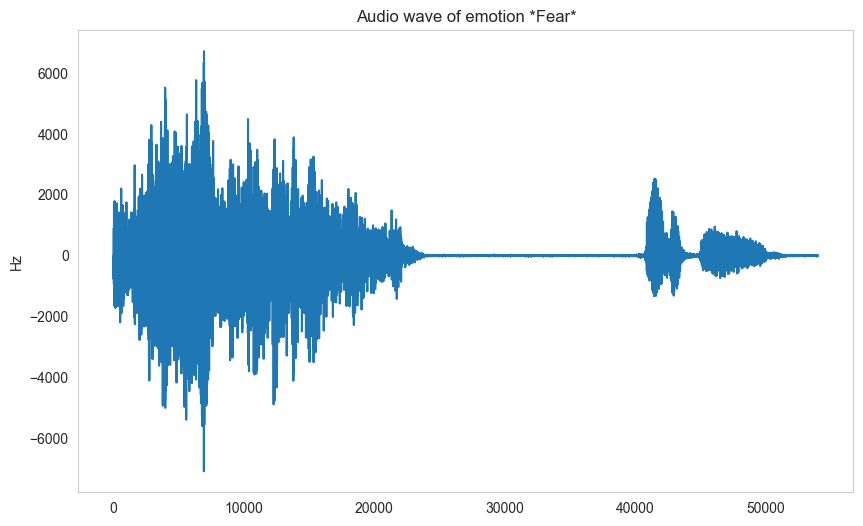

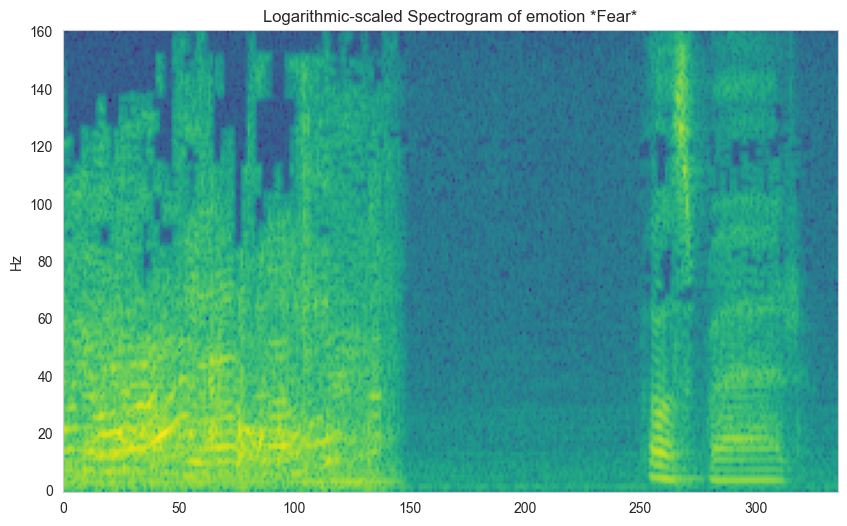

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


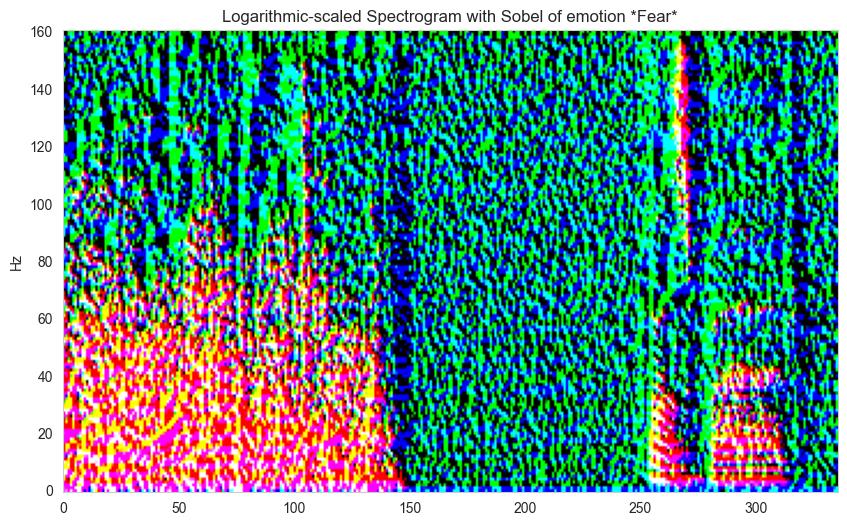

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


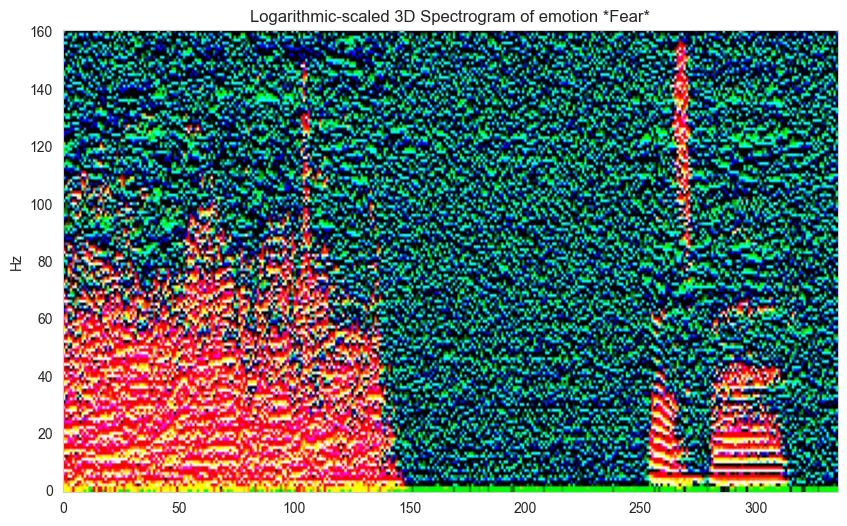

In [48]:
_audio_wave = audio2wave(filepath=df_emotion["file_path"].to_list()[0])
visualize_wave(_audio_wave, emotion_dict[emotion_num], "Audio wave")

_audio_spectrogram = audio2spectrogram(filepath=df_emotion["file_path"].to_list()[0])
visualize_spectrogram(_audio_spectrogram, emotion_dict[emotion_num], "Logarithmic-scaled Spectrogram")

# Sobel 3D
_audio_spectrogram_3d_sobel = gradients_channels(_audio_spectrogram)
visualize_emotion(_audio_spectrogram_3d_sobel.transpose(2, 0, 1), emotion_dict[emotion_num], "Logarithmic-scaled Spectrogram with Sobel")

# 3D
_audio_spectrogram_3d = get_3d_spectrogram(_audio_spectrogram)
visualize_emotion(_audio_spectrogram_3d.transpose(2, 0, 1), emotion_dict[emotion_num], "Logarithmic-scaled 3D Spectrogram")

### Frustration

In [49]:
emotion_num = 7

df_emotion = df[df["major_emotion"] == emotion_num]
df_emotion

,file_path,Curiosity,Uncertainty,Excitement,Happiness,Surprise,Disgust,Fear,Frustration,Valence,major_emotion
81,D:\Projects\masters_diploma\data\processed\Emo...,0,1,0,0,0,0,0,1,2.3333,7
82,D:\Projects\masters_diploma\data\processed\Emo...,1,1,0,0,1,0,0,1,4.0000,7
230,D:\Projects\masters_diploma\data\processed\Emo...,1,1,0,0,0,0,0,1,3.0000,7
232,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,0,0,0,0,1,3.0000,7
238,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,0,0,0,0,1,2.0000,7
267,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,0,0,0,0,1,2.3333,7
311,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,0,0,0,0,1,1.6667,7
313,D:\Projects\masters_diploma\data\processed\Emo...,1,1,0,0,1,0,0,1,4.0000,7
314,D:\Projects\masters_diploma\data\processed\Emo...,0,1,0,0,1,0,0,1,3.3333,7
315,D:\Projects\masters_diploma\data\processed\Emo...,0,1,0,0,1,0,0,1,3.3333,7


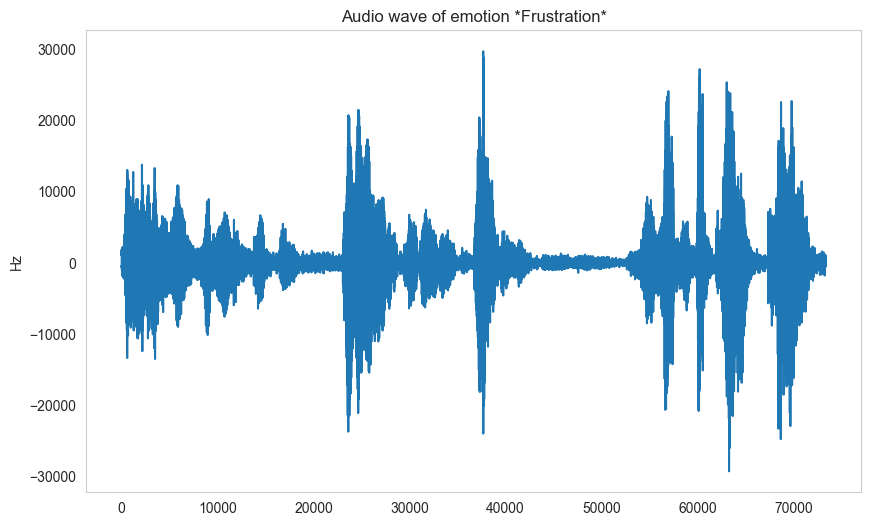

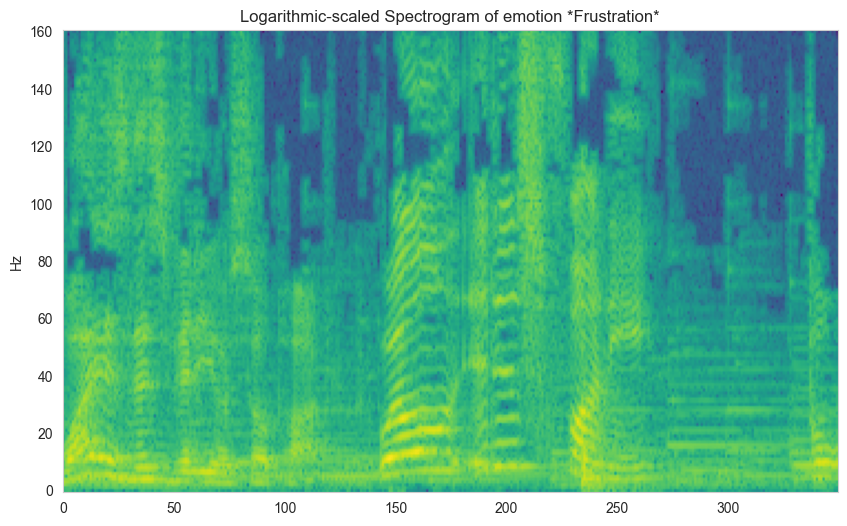

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


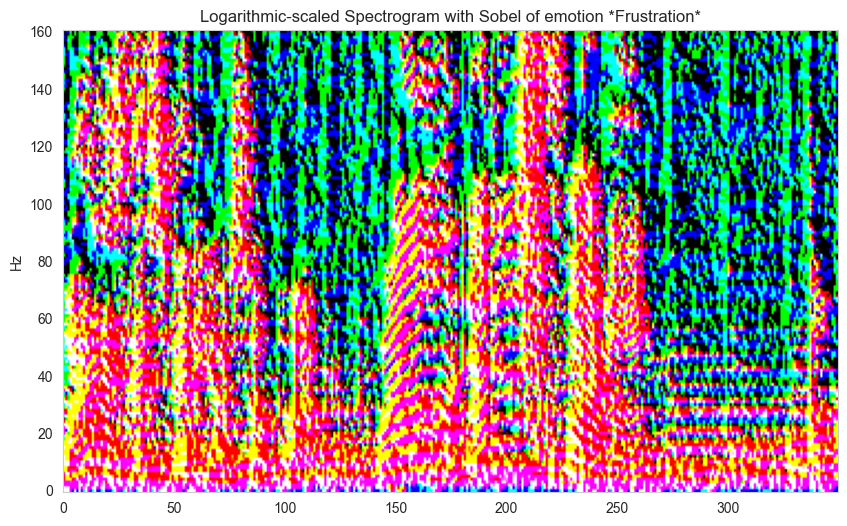

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


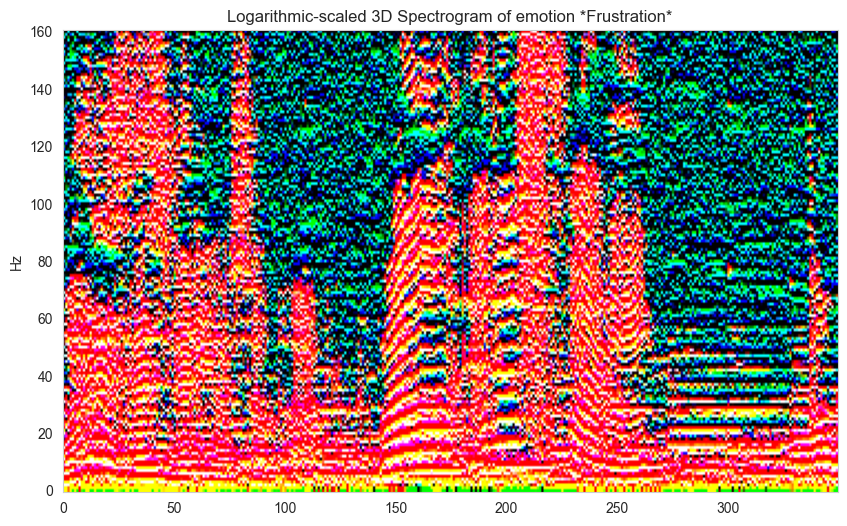

In [50]:
_audio_wave = audio2wave(filepath=df_emotion["file_path"].to_list()[2])
visualize_wave(_audio_wave, emotion_dict[emotion_num], "Audio wave")

_audio_spectrogram = audio2spectrogram(filepath=df_emotion["file_path"].to_list()[2])
visualize_spectrogram(_audio_spectrogram, emotion_dict[emotion_num], "Logarithmic-scaled Spectrogram")

# Sobel 3D
_audio_spectrogram_3d_sobel = gradients_channels(_audio_spectrogram)
visualize_emotion(_audio_spectrogram_3d_sobel.transpose(2, 0, 1), emotion_dict[emotion_num], "Logarithmic-scaled Spectrogram with Sobel")

# 3D
_audio_spectrogram_3d = get_3d_spectrogram(_audio_spectrogram)
visualize_emotion(_audio_spectrogram_3d.transpose(2, 0, 1), emotion_dict[emotion_num], "Logarithmic-scaled 3D Spectrogram")